<a href="https://colab.research.google.com/github/skku-kdj/MLRobustness_eval/blob/main/art/attack/evasion/blackbox/HopSkipJump_transformer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install adversarial-robustness-toolbox

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.5/30.5 MB 26.5 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 0.19.2 requires scikit-learn>=1.2.2, but you have scikit-learn 1.1.3 which is incompatible.


In [ ]:
import io
import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torchvision.models import vit_l_16, vit_b_16

from PIL import Image
import matplotlib.pyplot as plt

from art.attacks.evasion import HopSkipJump
from art.estimators.classification import BlackBoxClassifier
from art.utils import to_categorical

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
os.chdir('/content/drive/MyDrive/Colab_Notebooks/data')

Mounted at /content/drive


In [ ]:
with open("imagenet-classes.txt") as f:
  classes = [line.strip() for line in f.readlines()]
len(classes)

1000

In [ ]:
model = vit_l_16(pretrained=True)
model.to(device)
model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ViT_L_16_Weights.IMAGENET1K_V1`. You can also use `weights=ViT_L_16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vit_l_16-852ce7e3.pth" to /root/.cache/torch/hub/checkpoints/vit_l_16-852ce7e3.pth
100%|██████████| 1.13G/1.13G [00:28<00:00, 42.8MB/s]


VisionTransformer(
  (conv_proj): Conv2d(3, 1024, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=1024, out_features=1024, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=1024, out_features=4096, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=4096, out_features=1024, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
       

In [ ]:
model_cmp = vit_b_16(pretrained=True)
model_cmp.to(device)
model_cmp.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ViT_B_16_Weights.IMAGENET1K_V1`. You can also use `weights=ViT_B_16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth
100%|██████████| 330M/330M [00:02<00:00, 144MB/s]


VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

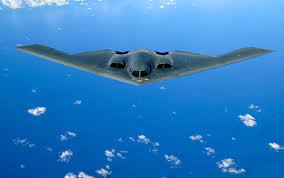

In [ ]:
image = Image.open("B2.jpg")
image

In [ ]:
transform = transforms.Compose([
  transforms.Resize(256),
  transforms.CenterCrop(224),
  transforms.ToTensor(),
  transforms.Normalize(
    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
batch = torch.unsqueeze(transform(image), 0)
batch = batch.to(device)
output = model(batch)

In [ ]:
def print_top5(output):
  _, indices = torch.sort(output, descending=True)
  percentage = torch.nn.functional.softmax(output, dim=1)[0] * 100
  print([(classes[idx], percentage[idx].item()) for idx in indices[0][:5]])

In [ ]:
print_top5(output)

[('warplane, military plane', 69.71344757080078), ('airliner', 8.592582702636719), ('wing', 3.660731792449951), ('electric ray, crampfish, numbfish, torpedo', 2.2165324687957764), ('projectile, missile', 2.189063549041748)]


#HopSkipJump attack

In [ ]:
def numpy_to_img(image_numpy):
  image_numpy = image_numpy.squeeze(0)
  image_numpy = image_numpy.transpose(1, 2, 0)
  image = image_numpy * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
  return image

In [ ]:
def predict(x):
  model = vit_l_16(pretrained=True)
  model.to(device)
  model.eval()
  x = torch.from_numpy(x).float()
  with torch.no_grad():
    outputs = model(x.to(device))
    _, predicted = torch.max(outputs.data, 1)

  y = torch.nn.functional.one_hot(predicted, num_classes=1000)
  y = y.cpu().numpy()
  return y

In [ ]:
classifier = BlackBoxClassifier(predict, input_shape=(3, 224, 224), nb_classes=1000)

##untargeted

In [ ]:
image_tensor = transform(image).unsqueeze(0)
image_numpy = image_tensor.numpy()

In [ ]:
attack = HopSkipJump(classifier=classifier, targeted=False, max_iter=0, max_eval=1000, init_eval=10)
iter_step = 10
x_adv = None

task takes more than 2 hour... attacking transformer needs more calculation

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ViT_L_16_Weights.IMAGENET1K_V1`. You can also use `weights=ViT_L_16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 0. L2 error 190.91988


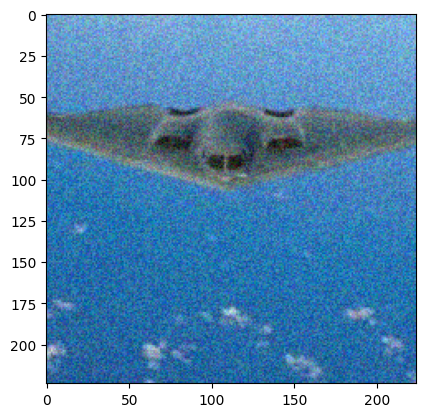

[('electric ray, crampfish, numbfish, torpedo', 25.21875762939453), ('warplane, military plane', 24.87518882751465), ('stingray', 13.16263198852539), ('tiger shark, Galeocerdo cuvieri', 10.701227188110352), ('puffer, pufferfish, blowfish, globefish', 5.104685306549072)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 10. L2 error 24.39341


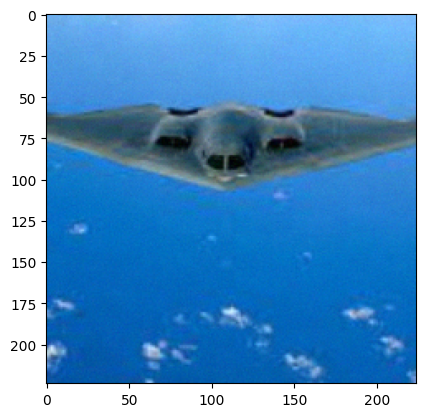

[('tiger shark, Galeocerdo cuvieri', 34.30134582519531), ('warplane, military plane', 18.168710708618164), ('electric ray, crampfish, numbfish, torpedo', 11.80562686920166), ('hammerhead, hammerhead shark', 10.468825340270996), ('gar, garfish, garpike, billfish, Lepisosteus osseus', 2.762003183364868)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 20. L2 error 15.668531


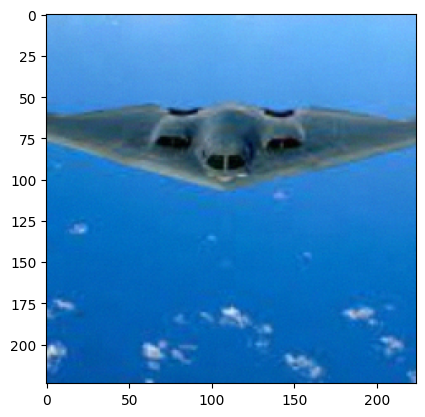

[('tiger shark, Galeocerdo cuvieri', 29.067975997924805), ('warplane, military plane', 20.109216690063477), ('electric ray, crampfish, numbfish, torpedo', 14.20479679107666), ('hammerhead, hammerhead shark', 11.288556098937988), ('airliner', 2.984581708908081)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 30. L2 error 11.343536


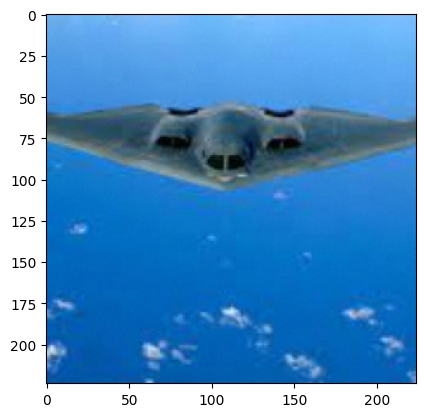

[('tiger shark, Galeocerdo cuvieri', 26.264551162719727), ('warplane, military plane', 22.612857818603516), ('electric ray, crampfish, numbfish, torpedo', 14.612557411193848), ('hammerhead, hammerhead shark', 10.903461456298828), ('airliner', 3.385448932647705)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 40. L2 error 8.806735


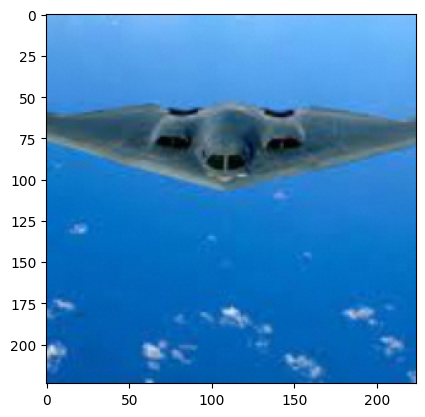

[('tiger shark, Galeocerdo cuvieri', 25.851076126098633), ('warplane, military plane', 22.862138748168945), ('electric ray, crampfish, numbfish, torpedo', 14.828680038452148), ('hammerhead, hammerhead shark', 10.54440689086914), ('airliner', 3.646076202392578)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 50. L2 error 7.2575884


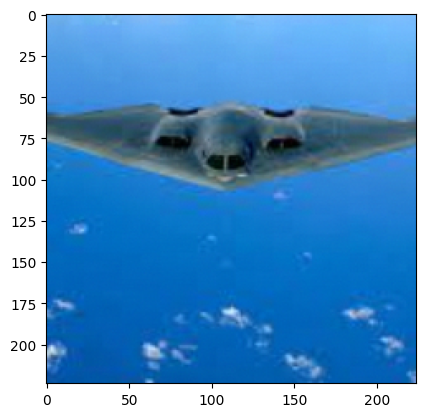

[('tiger shark, Galeocerdo cuvieri', 26.04002571105957), ('warplane, military plane', 22.889158248901367), ('electric ray, crampfish, numbfish, torpedo', 14.861772537231445), ('hammerhead, hammerhead shark', 10.704830169677734), ('airliner', 3.6005403995513916)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 60. L2 error 6.1364694


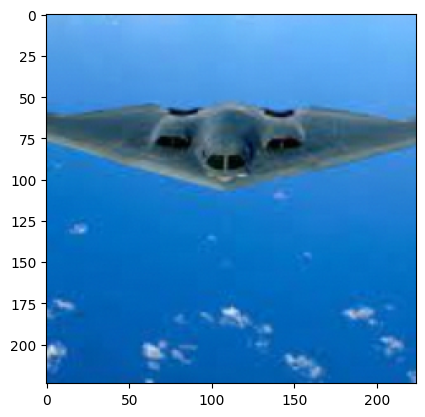

[('tiger shark, Galeocerdo cuvieri', 25.39788246154785), ('warplane, military plane', 23.388690948486328), ('electric ray, crampfish, numbfish, torpedo', 14.85288143157959), ('hammerhead, hammerhead shark', 10.505932807922363), ('airliner', 3.80706524848938)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 70. L2 error 5.4482374


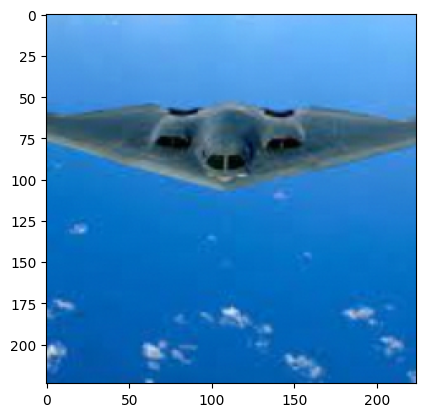

[('tiger shark, Galeocerdo cuvieri', 25.295595169067383), ('warplane, military plane', 23.435945510864258), ('electric ray, crampfish, numbfish, torpedo', 14.619660377502441), ('hammerhead, hammerhead shark', 10.523876190185547), ('airliner', 3.8552398681640625)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 80. L2 error 4.9321074


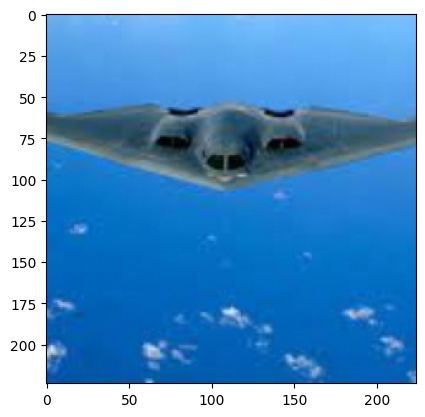

[('tiger shark, Galeocerdo cuvieri', 25.26816749572754), ('warplane, military plane', 23.601673126220703), ('electric ray, crampfish, numbfish, torpedo', 14.539752960205078), ('hammerhead, hammerhead shark', 10.556400299072266), ('airliner', 3.8856658935546875)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 90. L2 error 4.5049076


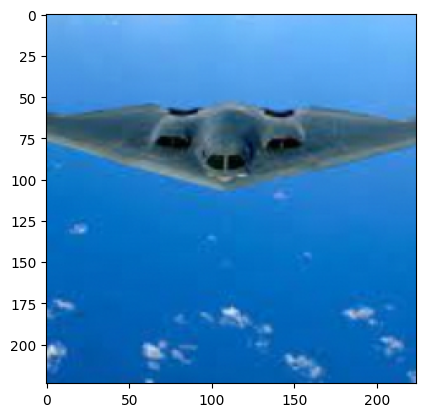

[('tiger shark, Galeocerdo cuvieri', 25.021150588989258), ('warplane, military plane', 23.61067771911621), ('electric ray, crampfish, numbfish, torpedo', 14.72452449798584), ('hammerhead, hammerhead shark', 10.57236099243164), ('airliner', 3.9455931186676025)]
None


In [ ]:
for i in range(10):
  x_adv = attack.generate(x=image_numpy, x_adv_init=x_adv, resume=True)
  print("Adversarial image at step %d." % (i * iter_step), "L2 error",
          np.linalg.norm(np.reshape(x_adv[0] - image_numpy, [-1])))
  plt.imshow(numpy_to_img(x_adv))
  plt.show()

  output = model(torch.from_numpy(x_adv).to(device))
  print(print_top5(output))

  attack.max_iter = iter_step

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 0. L2 error 26.756376


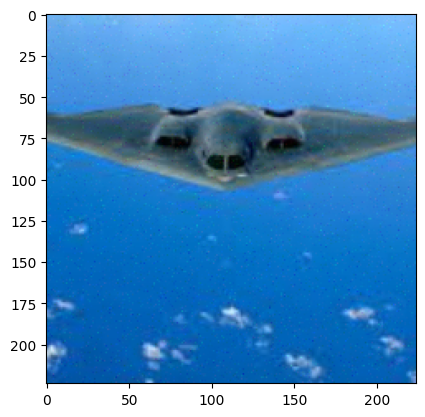

[('tiger shark, Galeocerdo cuvieri', 32.397544860839844), ('warplane, military plane', 17.999698638916016), ('electric ray, crampfish, numbfish, torpedo', 13.375692367553711), ('hammerhead, hammerhead shark', 11.495877265930176), ('gar, garfish, garpike, billfish, Lepisosteus osseus', 2.2230117321014404)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 10. L2 error 19.644602


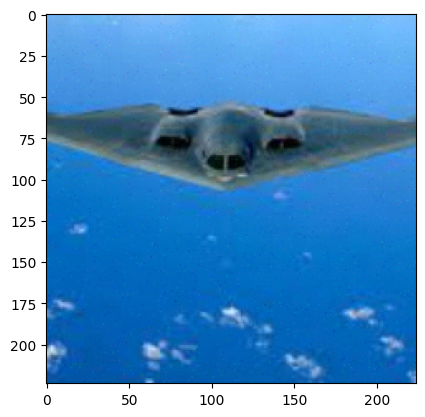

[('tiger shark, Galeocerdo cuvieri', 28.467214584350586), ('warplane, military plane', 20.721994400024414), ('electric ray, crampfish, numbfish, torpedo', 15.144893646240234), ('hammerhead, hammerhead shark', 10.81643009185791), ('airliner', 2.6370346546173096)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 20. L2 error 19.267385


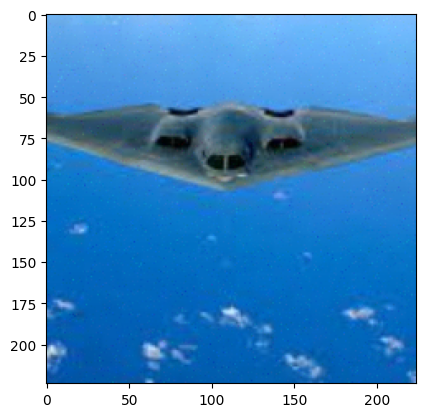

[('tiger shark, Galeocerdo cuvieri', 31.43463134765625), ('warplane, military plane', 21.89424705505371), ('electric ray, crampfish, numbfish, torpedo', 11.195425987243652), ('hammerhead, hammerhead shark', 11.024327278137207), ('airliner', 2.9158008098602295)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 30. L2 error 17.812227


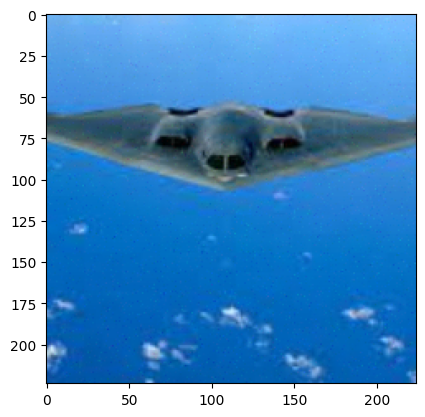

[('tiger shark, Galeocerdo cuvieri', 28.898195266723633), ('warplane, military plane', 21.53597068786621), ('electric ray, crampfish, numbfish, torpedo', 15.191086769104004), ('hammerhead, hammerhead shark', 10.372164726257324), ('airliner', 2.591918706893921)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 40. L2 error 19.948927


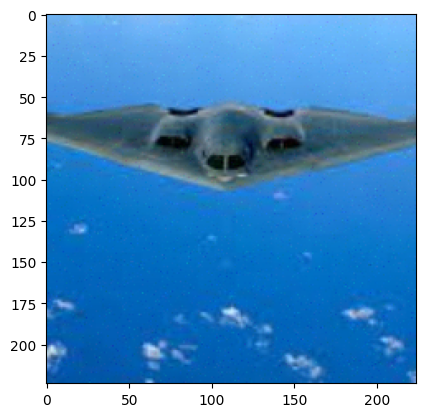

[('tiger shark, Galeocerdo cuvieri', 31.64689826965332), ('warplane, military plane', 18.849267959594727), ('electric ray, crampfish, numbfish, torpedo', 15.148015022277832), ('hammerhead, hammerhead shark', 10.550037384033203), ('gar, garfish, garpike, billfish, Lepisosteus osseus', 2.3443431854248047)]
None


In [ ]:
mask = np.random.binomial(n=1, p=0.1, size=np.prod(image_numpy.shape))
mask = mask.reshape(image_numpy.shape)
x_adv = None

for i in range(5):
  x_adv = attack.generate(x=image_numpy, x_adv_init=x_adv, mask=mask)
  print("Adversarial image at step %d." % (i * iter_step), "L2 error",
          np.linalg.norm(np.reshape(x_adv[0] - image_numpy, [-1])))
  plt.imshow(numpy_to_img(x_adv))
  plt.show()

  output = model(torch.from_numpy(x_adv).to(device))
  print(print_top5(output))

  attack.max_iter = iter_step

##targeted

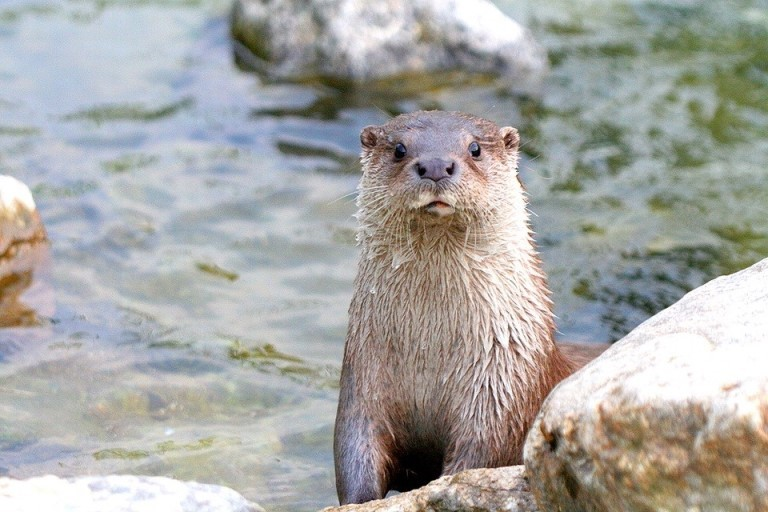

In [ ]:
init_image = Image.open("otter.jpg")
init_image

In [ ]:
for i in range(1000):
  if classes[i] == "otter":
    print(i)
    break

360


In [ ]:
init_image_tensor = transform(init_image).unsqueeze(0)
init_image_numpy = init_image_tensor.numpy()

In [ ]:
attack = HopSkipJump(classifier=classifier, targeted=True, max_iter=0, max_eval=1000, init_eval=10)
iter_step = 10

x_adv = init_image_numpy

task takes more than 3 hours

HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 0. L2 error 645.7109


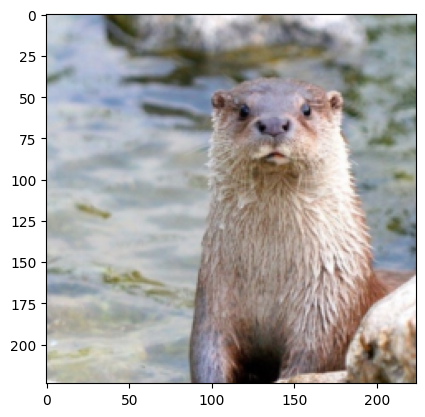

[('otter', 82.54199981689453), ('weasel', 3.4444425106048584), ('mink', 2.159259796142578), ('polecat, fitch, foulmart, foumart, Mustela putorius', 0.2906019985675812), ('badger', 0.10501935333013535)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 10. L2 error 194.84758


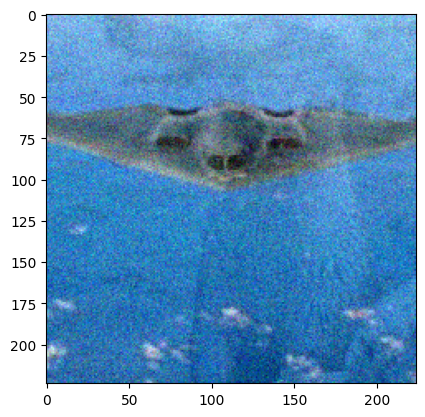

[('otter', 24.654644012451172), ('puffer, pufferfish, blowfish, globefish', 21.44367027282715), ('electric ray, crampfish, numbfish, torpedo', 13.501291275024414), ('tiger shark, Galeocerdo cuvieri', 7.066157341003418), ('stingray', 5.427527904510498)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 20. L2 error 156.14906


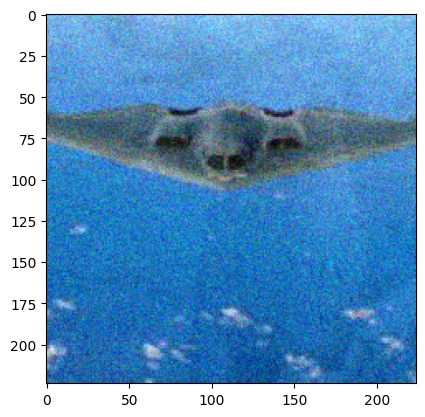

[('otter', 20.657482147216797), ('gar, garfish, garpike, billfish, Lepisosteus osseus', 17.015153884887695), ('electric ray, crampfish, numbfish, torpedo', 13.169776916503906), ('puffer, pufferfish, blowfish, globefish', 12.964622497558594), ('tiger shark, Galeocerdo cuvieri', 6.101138591766357)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 30. L2 error 123.35241


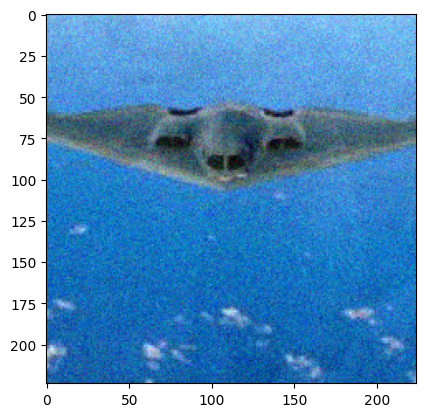

[('otter', 18.823444366455078), ('gar, garfish, garpike, billfish, Lepisosteus osseus', 12.960831642150879), ('tiger shark, Galeocerdo cuvieri', 10.68265151977539), ('electric ray, crampfish, numbfish, torpedo', 10.564560890197754), ('puffer, pufferfish, blowfish, globefish', 9.404181480407715)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 40. L2 error 87.658226


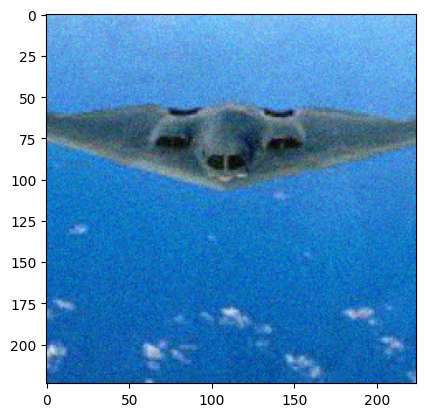

[('otter', 20.491823196411133), ('electric ray, crampfish, numbfish, torpedo', 15.847277641296387), ('tiger shark, Galeocerdo cuvieri', 11.466556549072266), ('gar, garfish, garpike, billfish, Lepisosteus osseus', 10.826375007629395), ('hammerhead, hammerhead shark', 6.346227169036865)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 50. L2 error 60.936768


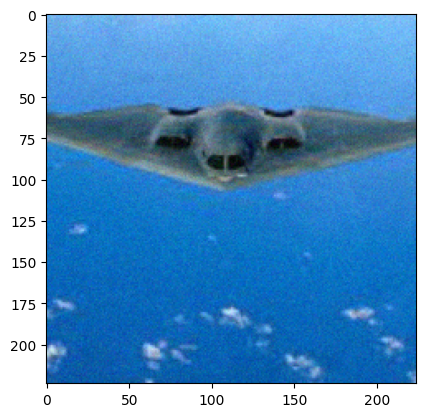

[('otter', 21.409013748168945), ('tiger shark, Galeocerdo cuvieri', 11.923088073730469), ('electric ray, crampfish, numbfish, torpedo', 11.203620910644531), ('hammerhead, hammerhead shark', 10.109777450561523), ('warplane, military plane', 8.859461784362793)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 60. L2 error 50.228554


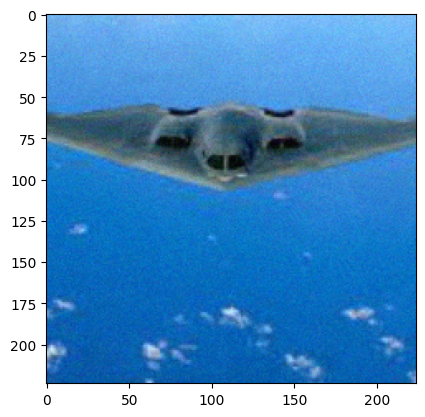

[('otter', 18.802846908569336), ('electric ray, crampfish, numbfish, torpedo', 11.982796669006348), ('tiger shark, Galeocerdo cuvieri', 10.879061698913574), ('hammerhead, hammerhead shark', 9.943968772888184), ('warplane, military plane', 9.085320472717285)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 70. L2 error 42.66916


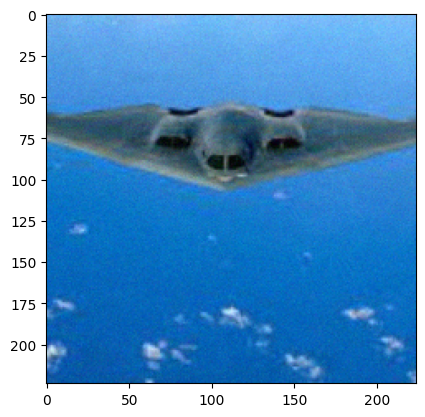

[('otter', 17.40283203125), ('electric ray, crampfish, numbfish, torpedo', 12.521767616271973), ('tiger shark, Galeocerdo cuvieri', 10.6939058303833), ('warplane, military plane', 10.076757431030273), ('gar, garfish, garpike, billfish, Lepisosteus osseus', 8.872579574584961)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 80. L2 error 33.081993


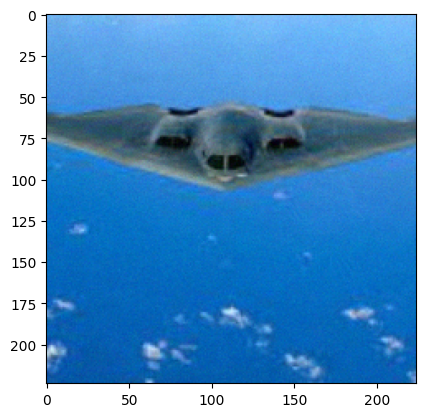

[('otter', 14.236760139465332), ('electric ray, crampfish, numbfish, torpedo', 12.695930480957031), ('tiger shark, Galeocerdo cuvieri', 12.688112258911133), ('warplane, military plane', 11.460785865783691), ('hammerhead, hammerhead shark', 8.893805503845215)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 90. L2 error 28.12243


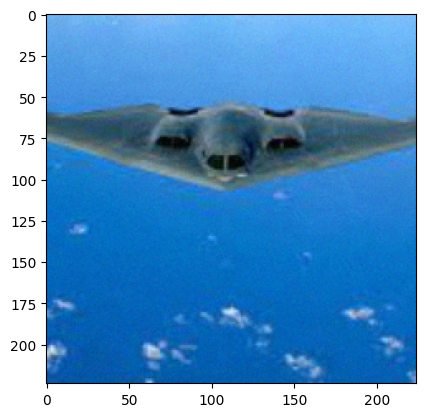

[('otter', 15.742100715637207), ('warplane, military plane', 12.940155029296875), ('electric ray, crampfish, numbfish, torpedo', 12.738256454467773), ('tiger shark, Galeocerdo cuvieri', 12.034521102905273), ('hammerhead, hammerhead shark', 8.48261833190918)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 100. L2 error 25.217295


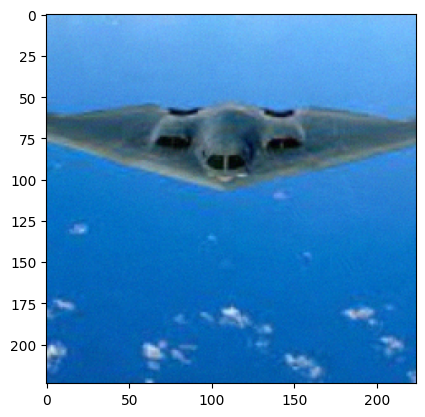

[('otter', 15.081543922424316), ('electric ray, crampfish, numbfish, torpedo', 12.926498413085938), ('warplane, military plane', 12.840694427490234), ('tiger shark, Galeocerdo cuvieri', 11.698370933532715), ('hammerhead, hammerhead shark', 8.06387710571289)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 110. L2 error 22.2249


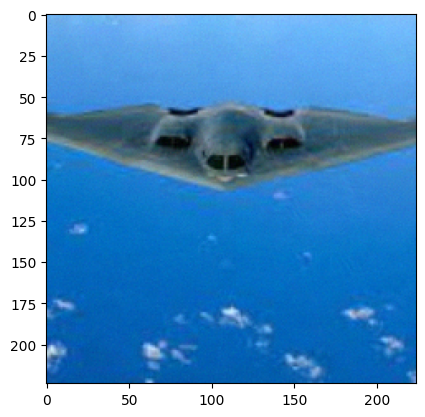

[('otter', 15.860692024230957), ('electric ray, crampfish, numbfish, torpedo', 12.975375175476074), ('warplane, military plane', 12.402437210083008), ('tiger shark, Galeocerdo cuvieri', 10.525239944458008), ('hammerhead, hammerhead shark', 7.396274089813232)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 120. L2 error 19.81163


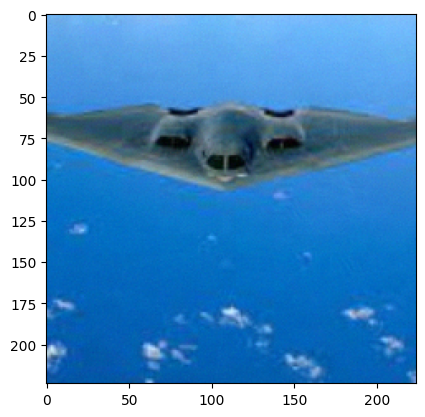

[('otter', 16.232467651367188), ('electric ray, crampfish, numbfish, torpedo', 12.669303894042969), ('warplane, military plane', 11.956682205200195), ('tiger shark, Galeocerdo cuvieri', 9.995975494384766), ('hammerhead, hammerhead shark', 6.9691009521484375)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 130. L2 error 17.957272


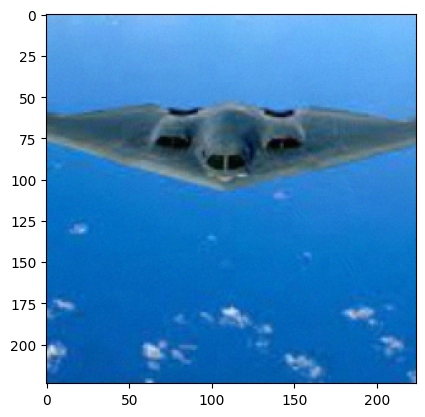

[('otter', 14.810503005981445), ('electric ray, crampfish, numbfish, torpedo', 12.579211235046387), ('warplane, military plane', 12.558863639831543), ('tiger shark, Galeocerdo cuvieri', 10.269006729125977), ('hammerhead, hammerhead shark', 7.174213409423828)]
None


HopSkipJump:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial image at step 140. L2 error 16.356369


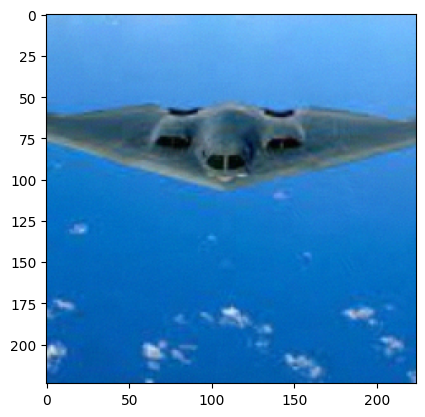

[('otter', 15.972663879394531), ('electric ray, crampfish, numbfish, torpedo', 13.31049633026123), ('warplane, military plane', 12.04731273651123), ('tiger shark, Galeocerdo cuvieri', 9.723514556884766), ('hammerhead, hammerhead shark', 7.019264221191406)]
None


In [ ]:
for i in range(15):
  x_adv = attack.generate(x=image_numpy, y=to_categorical([360], 1000), x_adv_init=x_adv, resume=True)
  print("Adversarial image at step %d." % (i * iter_step), "L2 error",
          np.linalg.norm(np.reshape(x_adv[0] - image_numpy, [-1])))
  plt.imshow(numpy_to_img(x_adv))
  plt.show()

  output = model(torch.from_numpy(x_adv).to(device))
  print(print_top5(output))

  attack.max_iter = iter_step